In [1]:
from google.colab import drive
drive.mount('/content/gdrive')
!ln -s /content/gdrive/My\ Drive/ /mydrive
%cd /mydrive/yolov11

Mounted at /content/gdrive
/content/gdrive/.shortcut-targets-by-id/1N1e6L9Tga2bF3c9mKY8K1qjRhbLw7xHn/yolov11


In [2]:
import os

def count_images(image_dir, exts={".jpg", ".jpeg", ".png", ".bmp", ".webp"}):
    image_count = 0
    for filename in os.listdir(image_dir):
        if os.path.splitext(filename.lower())[1] in exts:
            image_count += 1
    print(f"Total images: {image_count}")

count_images("datasets/markerpens/train/images")
count_images("datasets/markerpens/valid/images")

count_images("datasets/markerpen/train/images")
count_images("datasets/markerpen/valid/images")

Total images: 255
Total images: 20
Total images: 255
Total images: 20


In [3]:
def count_labels(labels_dir, exts={".txt"}):
    labels_count = 0
    for filename in os.listdir(labels_dir):
        if os.path.splitext(filename.lower())[1] in exts:
            labels_count += 1
    print(f"Total labels: {labels_count}")

count_labels("datasets/markerpens/train/labels")
count_labels("datasets/markerpens/valid/labels")

count_labels("datasets/markerpen/train/labels")
count_labels("datasets/markerpen/valid/labels")

Total labels: 255
Total labels: 20
Total labels: 255
Total labels: 20


In [ ]:
with open("datasets/data.yaml", 'r') as f:
    print(f.read())

train: markerpens/train/images
val: markerpens/valid/images
test: markerpens/test/images

kpt_shape: [3, 3]
flip_idx: [0, 1, 2]

nc: 1
names: ['ROI']

roboflow:
  workspace: nyi-nyi
  project: markerpens-keypoints
  version: 1
  license: CC BY 4.0
  url: https://universe.roboflow.com/nyi-nyi/markerpens-keypoints/dataset/1


In [ ]:
with open("datasets/markerpen.yaml", 'r') as f:
    print(f.read())

train: markerpen/train/images
val: markerpen/valid/images
test: markerpen/test/images

kpt_shape: [2, 3]
flip_idx: [0, 1]

nc: 1
names: ['ROI']

roboflow:
  workspace: nyi-nyi
  project: markerpens-keypoints-v2
  version: 1
  license: CC BY 4.0
  url: https://universe.roboflow.com/nyi-nyi/markerpens-keypoints-v2/dataset/1


In [2]:
!uv pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics 8.4.7 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 38.7/112.6 GB disk)


In [3]:
from ultralytics import YOLO

3P model

In [ ]:
# Load a model
model = YOLO("yolo26m-pose.yaml")  # build a new model from scratch
model = YOLO("yolo26m-pose.pt")  # load a pretrained model (recommended for training)

# Use the model
model.train(data="datasets/data.yaml", epochs=50, imgsz=640, patience=0, batch=16, pose=40.0, kobj=0.5, cache=True)  # train the model

Ultralytics 8.4.7 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=True, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=datasets/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=0.5, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo26m-pose.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train9, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=0, perspective=0.0, plots=True, pose=4

ultralytics.utils.metrics.PoseMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79c60d243290>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(P)', 'F1-Confidence(P)', 'Precision-Confidence(P)', 'Recall-Confidence(P)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034, 

In [ ]:
model = YOLO("runs/pose/train9/weights/best.pt")
model.val()

Ultralytics 8.4.7 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLO26m-pose summary (fused): 142 layers, 21,200,234 parameters, 0 gradients, 71.5 GFLOPs
val: Fast image access ✅ (ping: 0.5±0.1 ms, read: 78.8±64.6 MB/s, size: 338.7 KB)
val: Scanning /content/gdrive/.shortcut-targets-by-id/1N1e6L9Tga2bF3c9mKY8K1qjRhbLw7xHn/yolov11/datasets/markerpens/valid/labels.cache... 20 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 20/20 5.2Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 1.1s/it 2.1s
                   all         20         20      0.998          1      0.995      0.948      0.998          1      0.995      0.977
Speed: 14.8ms preprocess, 43.6ms inference, 0.0ms loss, 0.3ms postprocess per image
Results saved to /content/gdrive/.shortcut-targets-by-id/1N1e6L9Tga2bF3c9mKY8K1qjRhbLw7xHn/yolov11/runs/pose/val4


ultralytics.utils.metrics.PoseMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79c60d26bec0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(P)', 'F1-Confidence(P)', 'Precision-Confidence(P)', 'Recall-Confidence(P)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034, 

In [ ]:
!ls runs/pose/train9/

args.yaml			 PoseF1_curve.png  train_batch2.jpg
BoxF1_curve.png			 PoseP_curve.png   train_batch640.jpg
BoxP_curve.png			 PosePR_curve.png  train_batch641.jpg
BoxPR_curve.png			 PoseR_curve.png   train_batch642.jpg
BoxR_curve.png			 results.csv	   val_batch0_labels.jpg
confusion_matrix_normalized.png  results.png	   val_batch0_pred.jpg
confusion_matrix.png		 train_batch0.jpg  weights
labels.jpg			 train_batch1.jpg


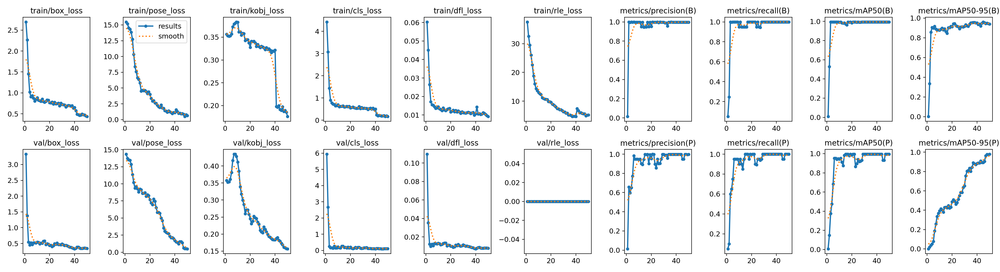

In [ ]:
from IPython.display import Image as IPyImage

IPyImage(filename=f'runs/pose/train9/results.png', width=600)

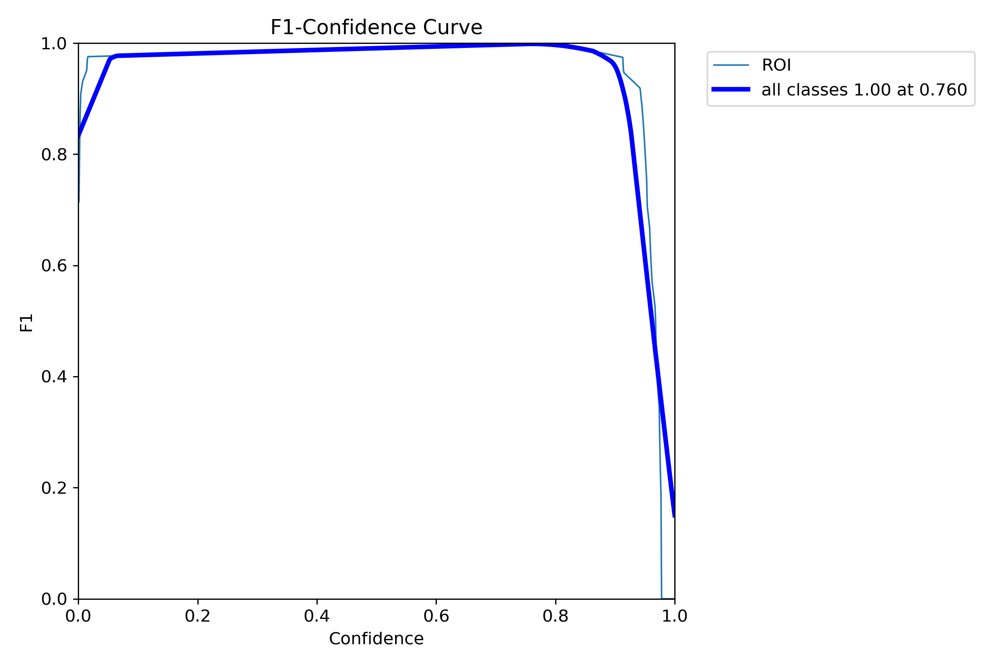

In [ ]:
from IPython.display import Image as IPyImage

IPyImage(filename=f'runs/pose/train9/PoseF1_curve.png', width=600)

In [ ]:
model = YOLO("runs/pose/train9/weights/best.pt")
model(source="datasets/markerpens/test/images", conf=0.5, save=True)


image 1/5 /content/gdrive/.shortcut-targets-by-id/1N1e6L9Tga2bF3c9mKY8K1qjRhbLw7xHn/yolov11/datasets/markerpens/test/images/6A3A70A1-514E-42A5-8348-83D8CEC6DB50_jpeg_jpg.rf.fd632cdd7c7226f7ddb83588d4db6727.jpg: 640x480 2 ROIs, 56.5ms
image 2/5 /content/gdrive/.shortcut-targets-by-id/1N1e6L9Tga2bF3c9mKY8K1qjRhbLw7xHn/yolov11/datasets/markerpens/test/images/721A87F9-AAB8-4DFE-B54B-7F12899338B7_jpeg_jpg.rf.afc34240a426b8306de523042e653a40.jpg: 640x480 1 ROI, 29.9ms
image 3/5 /content/gdrive/.shortcut-targets-by-id/1N1e6L9Tga2bF3c9mKY8K1qjRhbLw7xHn/yolov11/datasets/markerpens/test/images/791B657F-ECFC-494E-9D29-19E4FD891119_jpeg_jpg.rf.b3727303eacfaa9ad700c89c393ef222.jpg: 640x480 1 ROI, 29.8ms
image 4/5 /content/gdrive/.shortcut-targets-by-id/1N1e6L9Tga2bF3c9mKY8K1qjRhbLw7xHn/yolov11/datasets/markerpens/test/images/A205224A-92B5-42AB-85C0-402A9A73D424_jpeg_jpg.rf.77f610e5a3b58e40a1584a75d45cd867.jpg: 640x480 1 ROI, 29.9ms
image 5/5 /content/gdrive/.shortcut-targets-by-id/1N1e6L9Tga2bF3c9

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: ultralytics.engine.results.Keypoints object
 masks: None
 names: {0: 'ROI'}
 obb: None
 orig_img: array([[[227, 228, 226],
         [227, 228, 226],
         [227, 228, 226],
         ...,
         [198, 203, 202],
         [198, 203, 202],
         [197, 202, 201]],
 
        [[227, 228, 226],
         [227, 228, 226],
         [227, 228, 226],
         ...,
         [198, 203, 202],
         [198, 203, 202],
         [197, 202, 201]],
 
        [[227, 228, 226],
         [227, 228, 226],
         [227, 228, 226],
         ...,
         [199, 204, 203],
         [198, 203, 202],
         [198, 203, 202]],
 
        ...,
 
        [[213, 212, 208],
         [213, 212, 208],
         [213, 212, 208],
         ...,
         [186, 191, 189],
         [185, 190, 188],
         [185, 190, 188]],
 
        [[213, 212, 208],
         [213, 212, 208],
         [213, 212, 20

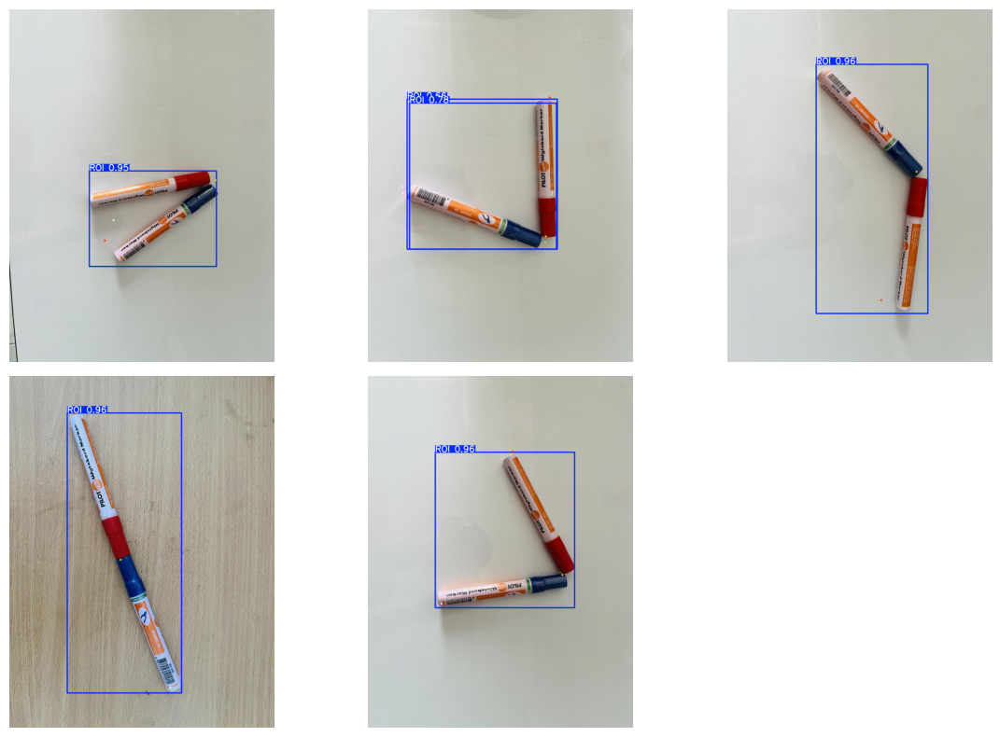

In [ ]:
import os, random, cv2
import numpy as np
import matplotlib.pyplot as plt

# ---------------- CONFIG ----------------
results_dir = "runs/pose/predict8/"

# visualization layout
N = 5
cols = 3
rows = int(np.ceil(N / cols))

# random image selection
all_imgs = [os.path.join(results_dir, f)
            for f in os.listdir(results_dir)
            if f.lower().endswith((".jpg", ".png", ".jpeg"))]

sample_imgs = random.sample(all_imgs, N)

plt.figure(figsize=(4 * cols, 4 * rows))

for i, image in enumerate(sample_imgs):
    plt.subplot(2, 3, i+1)
    plt.subplot(rows, cols, i + 1)
    image = cv2.imread(image)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.axis("off")

plt.tight_layout()
plt.show()

2P model

In [ ]:
# Load a model
model = YOLO("yolo26m-pose.yaml")  # build a new model from scratch
model = YOLO("yolo26m-pose.pt")  # load a pretrained model (recommended for training)

# Use the model
model.train(data="datasets/markerpen.yaml", epochs=50, imgsz=640, patience=0, batch=16, pose=40.0, kobj=0.5, cache=True)  # train the model

Ultralytics 8.4.7 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=True, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=datasets/markerpen.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=0.5, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo26m-pose.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train10, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=0, perspective=0.0, plots=True, 

ultralytics.utils.metrics.PoseMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79c5edf12cf0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(P)', 'F1-Confidence(P)', 'Precision-Confidence(P)', 'Recall-Confidence(P)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034, 

In [ ]:
model = YOLO("runs/pose/train10/weights/best.pt")
model.val()

Ultralytics 8.4.7 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLO26m-pose summary (fused): 142 layers, 21,199,649 parameters, 0 gradients, 71.5 GFLOPs
val: Fast image access ✅ (ping: 0.5±0.1 ms, read: 133.6±76.7 MB/s, size: 425.4 KB)
val: Scanning /content/gdrive/.shortcut-targets-by-id/1N1e6L9Tga2bF3c9mKY8K1qjRhbLw7xHn/yolov11/datasets/markerpen/valid/labels.cache... 20 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 20/20 5.6Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 1.4it/s 1.5s
                   all         20         40      0.976      0.997      0.994      0.921      0.885        0.8      0.803      0.803
Speed: 9.5ms preprocess, 23.1ms inference, 0.0ms loss, 0.3ms postprocess per image
Results saved to /content/gdrive/.shortcut-targets-by-id/1N1e6L9Tga2bF3c9mKY8K1qjRhbLw7xHn/yolov11/runs/pose/val5


ultralytics.utils.metrics.PoseMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79c5f22cf650>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(P)', 'F1-Confidence(P)', 'Precision-Confidence(P)', 'Recall-Confidence(P)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034, 

In [ ]:
!ls runs/pose/train10/

args.yaml			 PoseF1_curve.png  train_batch2.jpg
BoxF1_curve.png			 PoseP_curve.png   train_batch640.jpg
BoxP_curve.png			 PosePR_curve.png  train_batch641.jpg
BoxPR_curve.png			 PoseR_curve.png   train_batch642.jpg
BoxR_curve.png			 results.csv	   val_batch0_labels.jpg
confusion_matrix_normalized.png  results.png	   val_batch0_pred.jpg
confusion_matrix.png		 train_batch0.jpg  weights
labels.jpg			 train_batch1.jpg


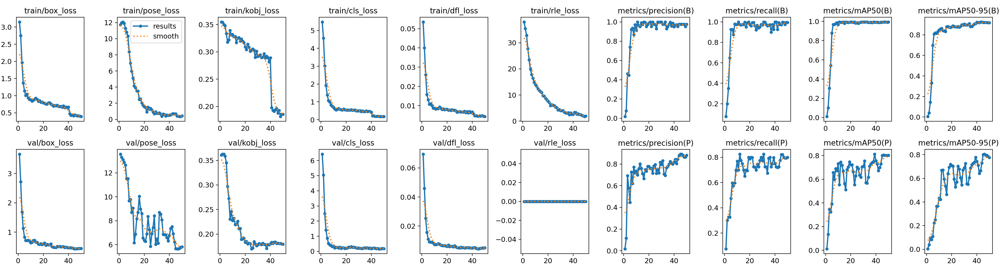

In [ ]:
from IPython.display import Image as IPyImage

IPyImage(filename=f'runs/pose/train10/results.png', width=600)

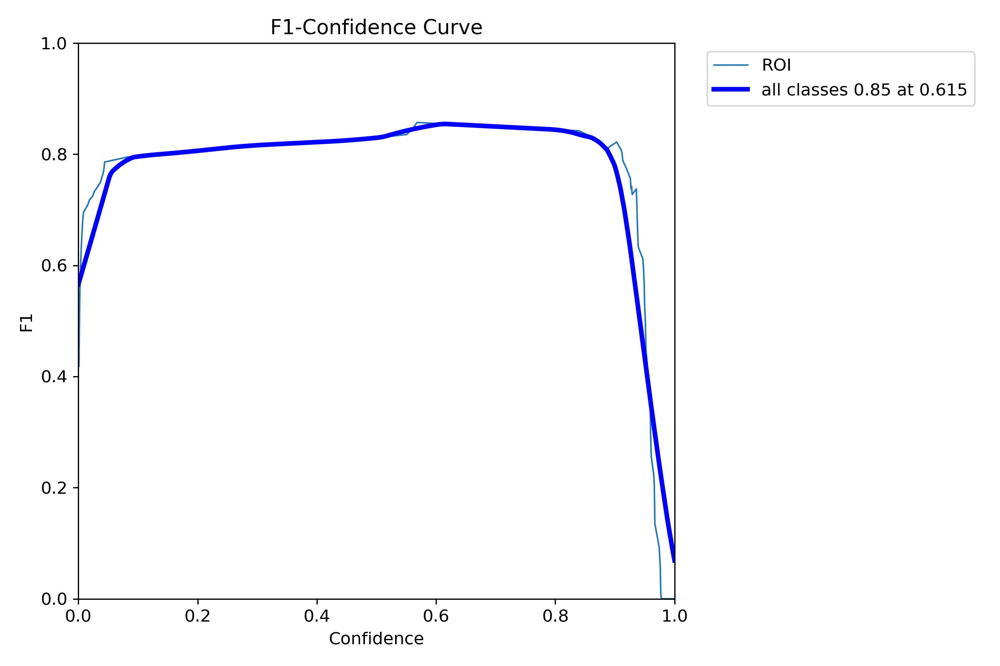

In [ ]:
from IPython.display import Image as IPyImage

IPyImage(filename=f'runs/pose/train10/PoseF1_curve.png', width=600)

In [ ]:
model = YOLO("runs/pose/train10/weights/best.pt")
model(source="datasets/markerpen/test/images", conf=0.5, save=True)


image 1/5 /content/gdrive/.shortcut-targets-by-id/1N1e6L9Tga2bF3c9mKY8K1qjRhbLw7xHn/yolov11/datasets/markerpen/test/images/7F271646-03B2-459F-B3B5-F6EF2F9A952F_jpeg_jpg.rf.07b62155eb74f668d0da02b342916991.jpg: 640x448 2 ROIs, 31.9ms
image 2/5 /content/gdrive/.shortcut-targets-by-id/1N1e6L9Tga2bF3c9mKY8K1qjRhbLw7xHn/yolov11/datasets/markerpen/test/images/883342A2-D75E-4F96-A264-9D9A14EFA20C_jpeg_jpg.rf.f911eb2ce945f15cd222ff29b44730d7.jpg: 640x480 2 ROIs, 31.6ms
image 3/5 /content/gdrive/.shortcut-targets-by-id/1N1e6L9Tga2bF3c9mKY8K1qjRhbLw7xHn/yolov11/datasets/markerpen/test/images/A8CE64B9-C36E-43A1-83E9-4F0B8DFA3F84_jpeg_jpg.rf.1bcc0fb9504fad432f88ca5faa2fd56a.jpg: 640x480 2 ROIs, 30.0ms
image 4/5 /content/gdrive/.shortcut-targets-by-id/1N1e6L9Tga2bF3c9mKY8K1qjRhbLw7xHn/yolov11/datasets/markerpen/test/images/E1B6D997-3F28-40A1-A6E6-DC680EA1CAC9_jpeg_jpg.rf.5f15ad11dcb5062979ceb9d013028e68.jpg: 640x480 2 ROIs, 29.9ms
image 5/5 /content/gdrive/.shortcut-targets-by-id/1N1e6L9Tga2bF3c9m

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: ultralytics.engine.results.Keypoints object
 masks: None
 names: {0: 'ROI'}
 obb: None
 orig_img: array([[[228, 227, 223],
         [222, 221, 217],
         [217, 216, 212],
         ...,
         [217, 216, 212],
         [215, 214, 210],
         [215, 214, 210]],
 
        [[224, 223, 219],
         [220, 219, 215],
         [217, 216, 212],
         ...,
         [223, 222, 218],
         [223, 222, 218],
         [224, 223, 219]],
 
        [[224, 223, 219],
         [221, 220, 216],
         [219, 218, 214],
         ...,
         [226, 225, 221],
         [227, 226, 222],
         [228, 227, 223]],
 
        ...,
 
        [[180, 178, 177],
         [184, 182, 181],
         [189, 187, 186],
         ...,
         [221, 217, 216],
         [221, 217, 216],
         [220, 216, 215]],
 
        [[184, 182, 181],
         [185, 183, 182],
         [187, 185, 18

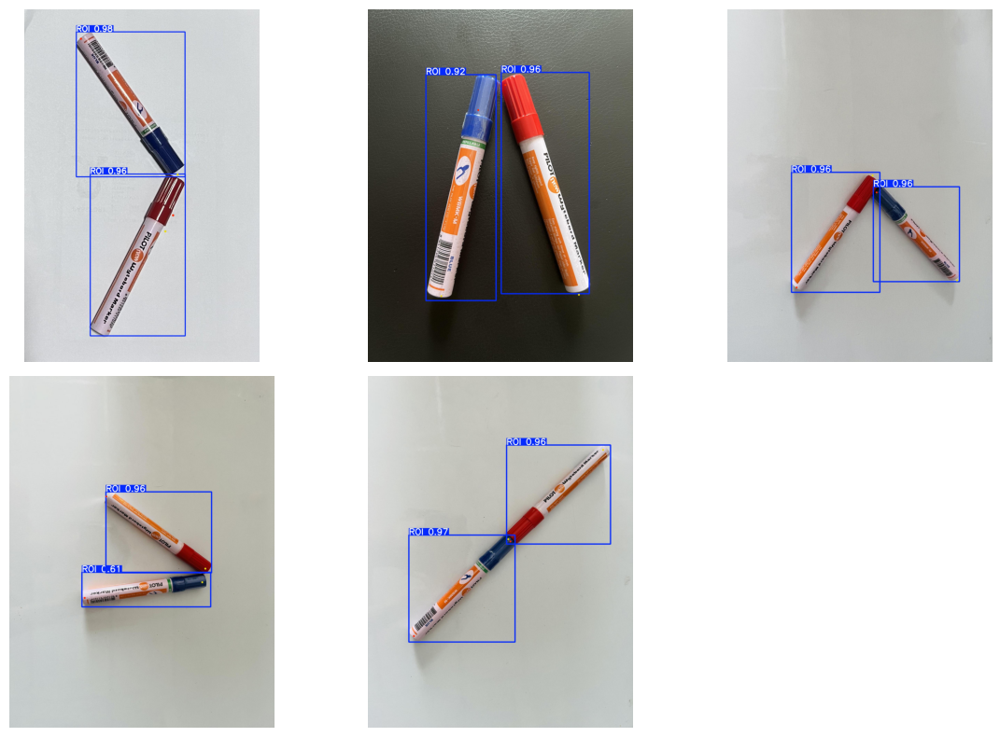

In [ ]:
import os, random, cv2
import numpy as np
import matplotlib.pyplot as plt

# ---------------- CONFIG ----------------
results_dir = "runs/pose/predict9/"

# visualization layout
N = 5
cols = 3
rows = int(np.ceil(N / cols))

# random image selection
all_imgs = [os.path.join(results_dir, f)
            for f in os.listdir(results_dir)
            if f.lower().endswith((".jpg", ".png", ".jpeg"))]

sample_imgs = random.sample(all_imgs, N)

plt.figure(figsize=(4 * cols, 4 * rows))

for i, image in enumerate(sample_imgs):
    plt.subplot(2, 3, i+1)
    plt.subplot(rows, cols, i + 1)
    image = cv2.imread(image)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
model = YOLO("runs/pose/train10/weights/best.pt")
model(source="datasets/markerpen/valid/images", conf=0.5, save=True)


image 1/20 /content/gdrive/.shortcut-targets-by-id/1N1e6L9Tga2bF3c9mKY8K1qjRhbLw7xHn/yolov11/datasets/markerpen/valid/images/129D9B06-BC89-487C-B111-DE096B4B6746_jpeg_jpg.rf.cfcd7af266640a56a39b3a04961a69a5.jpg: 640x480 2 ROIs, 31.0ms
image 2/20 /content/gdrive/.shortcut-targets-by-id/1N1e6L9Tga2bF3c9mKY8K1qjRhbLw7xHn/yolov11/datasets/markerpen/valid/images/1B3246F6-8785-4465-AC56-3BE7AA44003D_jpeg_jpg.rf.b55f2e54bb1e7a580f5cbb2074b66433.jpg: 640x480 2 ROIs, 29.7ms
image 3/20 /content/gdrive/.shortcut-targets-by-id/1N1e6L9Tga2bF3c9mKY8K1qjRhbLw7xHn/yolov11/datasets/markerpen/valid/images/20F8FA10-F0CA-4527-A36E-E5FCC6C1B3BC_jpeg_jpg.rf.ac764bb6b57fcae435e90ec9a311628b.jpg: 640x480 2 ROIs, 29.7ms
image 4/20 /content/gdrive/.shortcut-targets-by-id/1N1e6L9Tga2bF3c9mKY8K1qjRhbLw7xHn/yolov11/datasets/markerpen/valid/images/2961BB7E-04E6-45A1-B2B0-D31623BBF95E_jpeg_jpg.rf.57fe7abe24287c12b344a52c8f6607e3.jpg: 640x480 2 ROIs, 27.5ms
image 5/20 /content/gdrive/.shortcut-targets-by-id/1N1e6L9T

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: ultralytics.engine.results.Keypoints object
 masks: None
 names: {0: 'ROI'}
 obb: None
 orig_img: array([[[230, 228, 227],
         [230, 228, 227],
         [230, 228, 227],
         ...,
         [ 21,  36,  39],
         [ 19,  34,  37],
         [ 17,  32,  35]],
 
        [[230, 228, 227],
         [230, 228, 227],
         [230, 228, 227],
         ...,
         [ 15,  30,  33],
         [ 16,  31,  34],
         [ 23,  38,  41]],
 
        [[230, 228, 227],
         [230, 228, 227],
         [230, 228, 227],
         ...,
         [ 14,  29,  32],
         [ 13,  28,  31],
         [ 24,  39,  42]],
 
        ...,
 
        [[213, 211, 210],
         [211, 209, 208],
         [209, 207, 206],
         ...,
         [184, 187, 185],
         [185, 188, 186],
         [185, 188, 186]],
 
        [[213, 211, 210],
         [211, 209, 208],
         [209, 207, 20

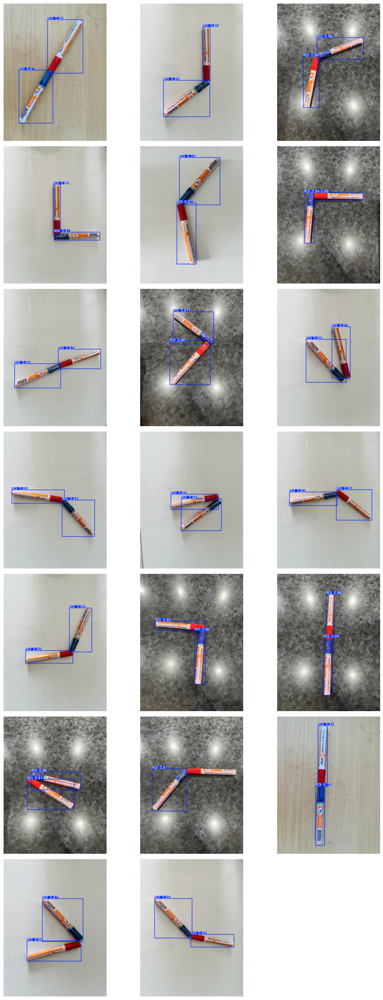

In [6]:
import os, random, cv2
import numpy as np
import matplotlib.pyplot as plt

# ---------------- CONFIG ----------------
results_dir = "runs/pose/predict10/"

# visualization layout
N = 20
cols = 3
rows = int(np.ceil(N / cols))

# random image selection
all_imgs = [os.path.join(results_dir, f)
            for f in os.listdir(results_dir)
            if f.lower().endswith((".jpg", ".png", ".jpeg"))]

sample_imgs = random.sample(all_imgs, N)

plt.figure(figsize=(4 * cols, 4 * rows))

for i, image in enumerate(sample_imgs):
    plt.subplot(7, 3, i+1)
    plt.subplot(rows, cols, i + 1)
    image = cv2.imread(image)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.axis("off")

plt.tight_layout()
plt.show()

In [4]:
# Load a model
model = YOLO("runs/pose/train10/weights/best.pt")
model.export(format='onnx')

Ultralytics 8.4.7 🚀 Python-3.12.12 torch-2.9.0+cu126 CPU (Intel Xeon CPU @ 2.00GHz)
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino/
YOLO26m-pose summary (fused): 142 layers, 21,199,649 parameters, 0 gradients, 71.5 GFLOPs

PyTorch: starting from 'runs/pose/train10/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 300, 12) (45.4 MB)
requirements: Ultralytics requirements ['onnx>=1.12.0,<2.0.0', 'onnxslim>=0.1.71', 'onnxruntime-gpu'] not found, attempting AutoUpdate...
Using Python 3.12.12 environment at: /usr
Resolved 14 packages in 287ms
Prepared 6 packages in 4.78s
Installed 6 packages in 418ms
 + colorama==0.4.6
 + coloredlogs==15.0.1
 + humanfriendly==10.0
 + onnx==1.20.1
 + onnxruntime-gpu==1.23.2
 + onnxslim==0.1.82

requirements: AutoUpdate success ✅ 5.8s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect


ONNX: starting ex

/usr/local/lib/python3.12/dist-packages/torch/onnx/_internal/torchscript_exporter/utils.py:1447: OnnxExporterWarning: Exporting to ONNX opset version 22 is not supported. by 'torch.onnx.export()'. The highest opset version supported is 20. To use a newer opset version, consider 'torch.onnx.export(..., dynamo=True)'. 
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/onnx/_internal/torchscript_exporter/symbolic_opset9.py:5353: UserWarning: Exporting aten::index operator of advanced indexing in opset 22 is achieved by combination of multiple ONNX operators, including Reshape, Transpose, Concat, and Gather. If indices include negative values, the exported graph will produce incorrect results.
  warnings.warn(


ONNX: slimming with onnxslim 0.1.82...
ONNX: export success ✅ 9.8s, saved as 'runs/pose/train10/weights/best.onnx' (81.3 MB)

Export complete (12.2s)
Results saved to /content/gdrive/.shortcut-targets-by-id/1N1e6L9Tga2bF3c9mKY8K1qjRhbLw7xHn/yolov11/runs/pose/train10/weights
Predict:         yolo predict task=pose model=runs/pose/train10/weights/best.onnx imgsz=640 
Validate:        yolo val task=pose model=runs/pose/train10/weights/best.onnx imgsz=640 data=datasets/markerpen.yaml  
Visualize:       https://netron.app


'runs/pose/train10/weights/best.onnx'

In [5]:
import onnxruntime
import numpy as np
import cv2
import torch

img_path = "datasets/markerpen/test/images/7F271646-03B2-459F-B3B5-F6EF2F9A952F_jpeg_jpg.rf.07b62155eb74f668d0da02b342916991.jpg"

img = cv2.imread(img_path)

if img is None:
    raise FileNotFoundError(f"Image not found at {img_path}")

img_resized = cv2.resize(img, (640, 640))
img_input = img_resized.astype(np.float32) / 255.0
img_input = img_input.transpose(2, 0, 1)[np.newaxis, :]  # (1, 3, H, W)

# Run inference
session = onnxruntime.InferenceSession("runs/pose/train10/weights/best.onnx", providers=["CPUExecutionProvider"])
input_name = session.get_inputs()[0].name
outputs = session.run(None, {input_name: img_input})

print("Output:", [o.shape for o in outputs])

out0 = outputs[0]

print("out0 shape:", out0.shape)

# inspect ONE prediction row
row = out0[0, 0]
print("one row length:", row.shape[0])
print("first 10 values:", row[:10])
print("last 40 values:", row[-40:])

Output: [(1, 300, 12)]
out0 shape: (1, 300, 12)
one row length: 12
first 10 values: [     176.33      293.61      440.61      604.41     0.97535           0      190.33      604.68     0.97123      418.32]
last 40 values: [     176.33      293.61      440.61      604.41     0.97535           0      190.33      604.68     0.97123      418.32      286.74      0.4732]


In [15]:
class_names = ['ROI']

import math
import time

def draw_keypoints(image, boxes, scores, class_ids, keypoints, kpt_thres=0.5):
    img = image.copy()

    # define per-keypoint colors (BGR)
    kpt_colors = [
        (255, 255, 0),   # cyan
        (0, 255, 255),   # yellow
    ]

    for box, score, cls, kpts in zip(boxes, scores, class_ids, keypoints):
        box_color = (0, 255, 0)
        x1, y1, x2, y2 = box.astype(int)

        # box
        cv2.rectangle(img, (x1, y1), (x2, y2), box_color, 4)

        # keypoints (index-aware)
        for i, (x, y, conf) in enumerate(kpts):
            if conf > kpt_thres:
                color = kpt_colors[i % len(kpt_colors)]
                cv2.circle(img, (int(x), int(y)), 10, color, -1)

        label = f"{class_names[cls]} {int(score*100)}%"
        cv2.putText(img, label, (x1, y1 - 15),
                    cv2.FONT_HERSHEY_SIMPLEX, 1.4, box_color, 2)

    return img

class YOLOPose:

    def __init__(self, path, conf_thres=0.5):
        self.conf_threshold = conf_thres

        # Initialize model
        self.initialize_model(path)

    def __call__(self, image):
        return self.pose_objects(image)

    def initialize_model(self, path):
        self.session = onnxruntime.InferenceSession(path,
                                                    providers=['CUDAExecutionProvider',
                                                               'CPUExecutionProvider'])
        # Get model info
        self.get_input_details()
        self.get_output_details()

    def pose_objects(self, image):
        input_tensor = self.prepare_input(image)

        # Perform inference on the image
        outputs = self.inference(input_tensor)

        self.boxes, self.scores, self.class_ids, self.keypoints = self.process_pose_output(outputs[0])

        return self.boxes, self.scores, self.class_ids, self.keypoints

    def prepare_input(self, image):
        self.img_height, self.img_width = image.shape[:2]

        input_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Resize input image
        input_img = cv2.resize(input_img, (self.input_width, self.input_height))

        # Scale input pixel values to 0 to 1
        input_img = input_img / 255.0
        input_img = input_img.transpose(2, 0, 1)
        input_tensor = input_img[np.newaxis, :, :, :].astype(np.float32)

        return input_tensor

    def inference(self, input_tensor):
        start = time.perf_counter()
        outputs = self.session.run(self.output_names, {self.input_names[0]: input_tensor})

        # print(f"Inference time: {(time.perf_counter() - start)*1000:.2f} ms")
        return outputs

    def process_pose_output(self, output):
        preds = np.squeeze(output)  # (300, 12)

        boxes = preds[:, 0:4]
        scores = preds[:, 4]
        class_ids = preds[:, 5].astype(int)
        keypoints = preds[:, 6:]  # (N, K*3)

        keep = scores > self.conf_threshold
        if not np.any(keep):
            return [], [], [], []

        boxes = boxes[keep]
        scores = scores[keep]
        class_ids = class_ids[keep]
        keypoints = keypoints[keep]

        # rescale boxes
        boxes[:, [0, 2]] *= self.img_width / self.input_width
        boxes[:, [1, 3]] *= self.img_height / self.input_height

        # reshape keypoints → (N, K, 3)
        num_kpts = keypoints.shape[1] // 3
        keypoints = keypoints.reshape(-1, num_kpts, 3)

        # rescale keypoints
        keypoints[..., 0] *= self.img_width / self.input_width
        keypoints[..., 1] *= self.img_height / self.input_height

        return boxes, scores, class_ids, keypoints

    def draw(self, image):
        return draw_keypoints(image, self.boxes, self.scores,
                              self.class_ids, self.keypoints)

    def get_input_details(self):
        model_inputs = self.session.get_inputs()
        self.input_names = [model_inputs[i].name for i in range(len(model_inputs))]

        self.input_shape = model_inputs[0].shape
        self.input_height = self.input_shape[2]
        self.input_width = self.input_shape[3]

    def get_output_details(self):
        model_outputs = self.session.get_outputs()
        self.output_names = [model_outputs[i].name for i in range(len(model_outputs))]

    @staticmethod
    def rescale_boxes(boxes, input_shape, image_shape):
        # Rescale boxes to original image dimensions
        input_shape = np.array([input_shape[1], input_shape[0], input_shape[1], input_shape[0]])
        boxes = np.divide(boxes, input_shape, dtype=np.float32)
        boxes *= np.array([image_shape[1], image_shape[0], image_shape[1], image_shape[0]])

        return boxes

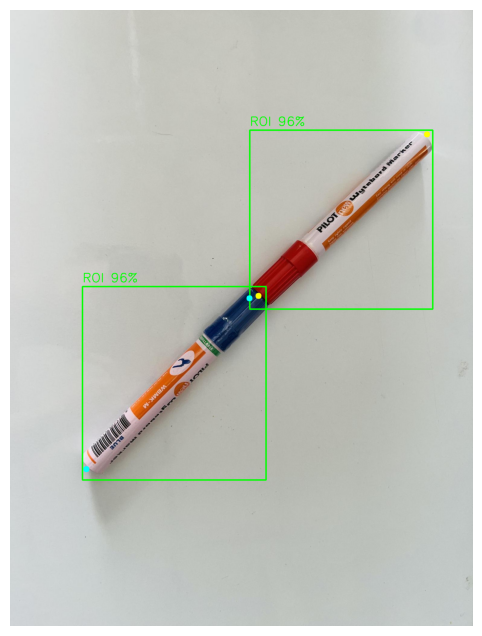

In [16]:
img_path = "datasets/markerpen/test/images/E1B6D997-3F28-40A1-A6E6-DC680EA1CAC9_jpeg_jpg.rf.5f15ad11dcb5062979ceb9d013028e68.jpg"

img = cv2.imread(img_path)

if img is None:
    raise FileNotFoundError(f"Image not found at {img_path}")

# Initialize YOLOv26 Keypoints detector
yolopose = YOLOPose("runs/pose/train10/weights/best.onnx", conf_thres=0.5)

# Detect keypoints
yolopose(img)

# Draw keypoints
combined_img = yolopose.draw(img)

import matplotlib.pyplot as plt
plt.figure(figsize=(12, 8))
plt.imshow(cv2.cvtColor(combined_img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

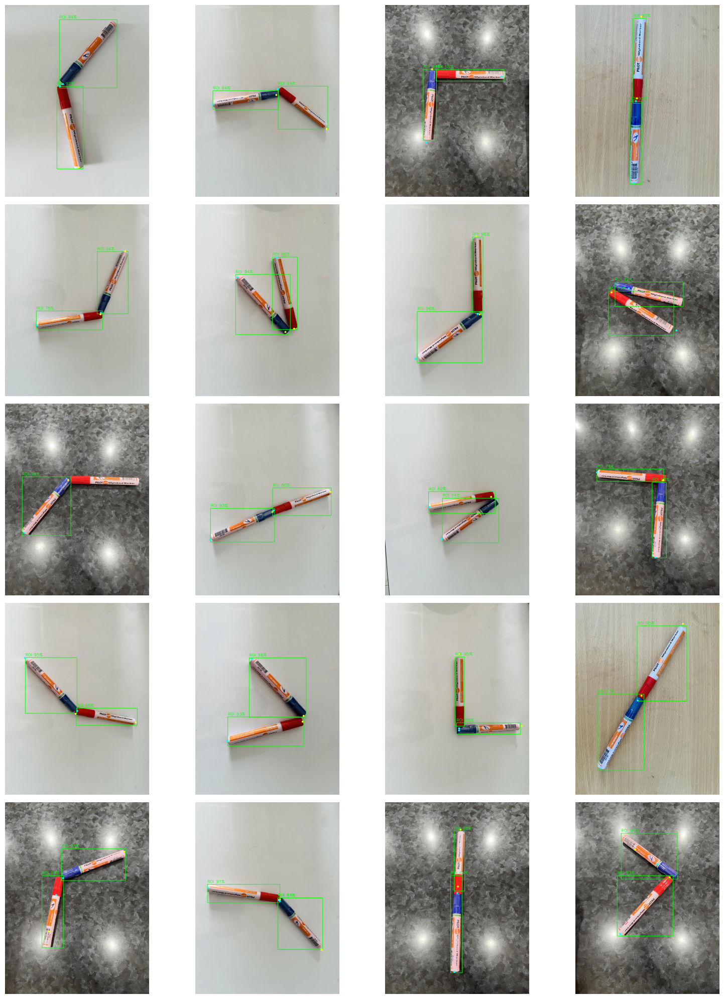

In [18]:
import os, random, cv2
import numpy as np
import matplotlib.pyplot as plt

# ---------------- CONFIG ----------------
results_dir = "datasets/markerpen/valid/images"

# Initialize YOLOv26 Keypoints detector
yolopose = YOLOPose("runs/pose/train10/weights/best.onnx", conf_thres=0.5)

# visualization layout
N = 20
cols = 4
rows = int(np.ceil(N / cols))

# random image selection
all_imgs = [os.path.join(results_dir, f)
            for f in os.listdir(results_dir)
            if f.lower().endswith((".jpg", ".png", ".jpeg"))]

sample_imgs = random.sample(all_imgs, N)

plt.figure(figsize=(4 * cols, 4 * rows))

for i, image in enumerate(sample_imgs):
    plt.subplot(5, 4, i+1)
    plt.subplot(rows, cols, i + 1)
    image = cv2.imread(image)

    # Detect keypoints
    yolopose(image)

    # Draw keypoints
    combined_img = yolopose.draw(image)
    combined_img = cv2.cvtColor(combined_img, cv2.COLOR_BGR2RGB)
    plt.imshow(combined_img)
    plt.axis("off")

plt.tight_layout()
plt.show()